# __Data Programming Project2__

## __Read the dataset and understand the data__

### Import the libraries

In [1]:
import json
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium

### Read the dataset

In [2]:
data = pd.read_csv('Hotel Reviews.csv')

In [3]:
data.isnull().sum()

address                     0
categories                  0
city                        0
country                     0
latitude                   86
longitude                  86
name                        0
postalCode                 55
province                    0
reviews.date              259
reviews.dateAdded           0
reviews.doRecommend     35912
reviews.id              35912
reviews.rating            862
reviews.text               22
reviews.title            1622
reviews.userCity        19649
reviews.username           43
reviews.userProvince    18394
dtype: int64

### Randomly check the data

In [4]:
data.sample(5)

,address,categories,city,country,latitude,longitude,name,postalCode,province,reviews.date,reviews.dateAdded,reviews.doRecommend,reviews.id,reviews.rating,reviews.text,reviews.title,reviews.userCity,reviews.username,reviews.userProvince
9166,1776 Grant St,Hotels,Denver,US,39.744501,-104.983568,Warwick Denver,80203,CO,2016-07-23T00:00:00Z,2016-08-03T20:37:59Z,NaN,NaN,5.0,Great to get downtown to see the Rockies baseb...,Great stop,NaN,joe,NaN
35882,1088 Powdermill Rd,"Cabins,Resorts & Vacation Cottages,Wedding Cha...",Gatlinburg,US,35.754868,-83.457295,Elk Springs Resort,37738,TN,2015-10-21T00:00:00Z,2016-06-23T16:50:58Z,NaN,NaN,5.0,We stayed in Smoky Mountain Romance with our 3...,Best place to stay in Gatlinburg!,Goose Creek,Heather B,IN
13787,Berliner Strasse 111,Hotels,Northbrook,US,50.106529,8.760921,Sheraton Offenbach Hotel,60065,IL,2015-11-20T00:00:00Z,2016-08-20T20:43:55Z,NaN,NaN,4.0,Auf Geschftsreise zufllig dort gelandet. Trotz...,Zentral. Alles ok,NaN,Jens,NaN
140,1700 N Livermore Ave,Hotels,Livermore,US,37.698349,-121.773710,Hawthorn Suites By Wyndham Livermore Wine Country,94551,CA,2015-05-29T00:00:00Z,2016-10-29T19:31:27Z,NaN,NaN,5.0,"Nice experience, despite the re-modeling const...",A Great Stay at Hawthorn Suites.,NaN,Anthony J.,NaN
29187,1535 Broadway,"Banquet Rooms,Hotels,Banquet Facilities,Hotels...",New York,US,40.758465,-73.985639,New York Marriott Marquis,10036,Nyc,2014-08-17T00:00:00Z,2017-03-26T17:25:47Z,NaN,NaN,NaN,The glass elevators are amazing,NaN,NaN,Mary McCabe,NaN


### Check the shape of the dataset

In [5]:
data.shape

(35912, 19)

### Check for datatypes

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35912 entries, 0 to 35911
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   address               35912 non-null  object 
 1   categories            35912 non-null  object 
 2   city                  35912 non-null  object 
 3   country               35912 non-null  object 
 4   latitude              35826 non-null  float64
 5   longitude             35826 non-null  float64
 6   name                  35912 non-null  object 
 7   postalCode            35857 non-null  object 
 8   province              35912 non-null  object 
 9   reviews.date          35653 non-null  object 
 10  reviews.dateAdded     35912 non-null  object 
 11  reviews.doRecommend   0 non-null      float64
 12  reviews.id            0 non-null      float64
 13  reviews.rating        35050 non-null  float64
 14  reviews.text          35890 non-null  object 
 15  reviews.title      

In [7]:
data.dtypes.value_counts()

object     14
float64     5
dtype: int64

### Check for descreptive statistics

In [8]:
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
address,35912,999,480 King St,1185,NaN,NaN,NaN,NaN,NaN,NaN,NaN
categories,35912,396,Hotels,21420,NaN,NaN,NaN,NaN,NaN,NaN,NaN
city,35912,761,Alexandria,1185,NaN,NaN,NaN,NaN,NaN,NaN,NaN
country,35912,1,US,35912,NaN,NaN,NaN,NaN,NaN,NaN,NaN
latitude,35826,NaN,NaN,NaN,37.285,6.99654,-25.4367,33.8273,37.936,41.6725,63.8777
longitude,35826,NaN,NaN,NaN,-85.7258,33.0623,-166.559,-104.868,-86.823,-77.0446,115.164
name,35912,879,"The Alexandrian, Autograph Collection",1185,NaN,NaN,NaN,NaN,NaN,NaN,NaN
postalCode,35857,911,22314,1185,NaN,NaN,NaN,NaN,NaN,NaN,NaN
province,35912,287,CA,3860,NaN,NaN,NaN,NaN,NaN,NaN,NaN
reviews.date,35653,3009,2016-07-25T00:00:00Z,113,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Check for column names and clean the data

In [9]:
data.columns

Index(['address', 'categories', 'city', 'country', 'latitude', 'longitude',
       'name', 'postalCode', 'province', 'reviews.date', 'reviews.dateAdded',
       'reviews.doRecommend', 'reviews.id', 'reviews.rating', 'reviews.text',
       'reviews.title', 'reviews.userCity', 'reviews.username',
       'reviews.userProvince'],
      dtype='object')

In [10]:
def to_clean(val):
    return val.strip().lower().replace("reviews.", '')

In [11]:
data.rename(columns=to_clean,inplace=True)
data.columns

Index(['address', 'categories', 'city', 'country', 'latitude', 'longitude',
       'name', 'postalcode', 'province', 'date', 'dateadded', 'dorecommend',
       'id', 'rating', 'text', 'title', 'usercity', 'username',
       'userprovince'],
      dtype='object')

## __Exploratory Data Analysis__

### Remove the unnecessary columns

In [12]:
df = data[['name','address','city','postalcode',
         'country','latitude','longitude',
         'categories','province','date','dateadded',
         'text','username','rating']]
df.sample()

,name,address,city,postalcode,country,latitude,longitude,categories,province,date,dateadded,text,username,rating
34591,Holiday Inn Express & Suites Crossville,560 Peavine Rd,Crossville,38571,US,35.96427,-84.98142,"Wedding Sites,Hotels,Hotels & Motels,Meeting F...",TN,2014-08-25T00:00:00Z,2016-11-16T02:52:30Z,A very clean newer hotel right off I-40 exit 3...,Warren,5.0


In [13]:
plt.style.use('fivethirtyeight')

### Check for the top 10 hotels with the most reviews

<AxesSubplot:>

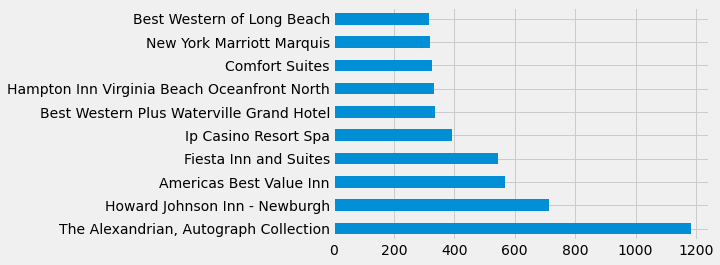

In [14]:
df.name.value_counts()[:10].plot(kind = 'barh')

### Check for cities with the most ratings count

<AxesSubplot:>

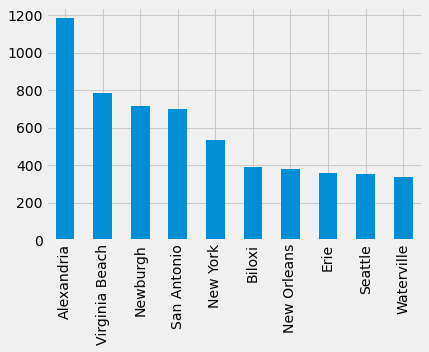

In [15]:
df.city.value_counts()[:10].plot(kind = 'bar')

### Checking for different categories

<AxesSubplot:>

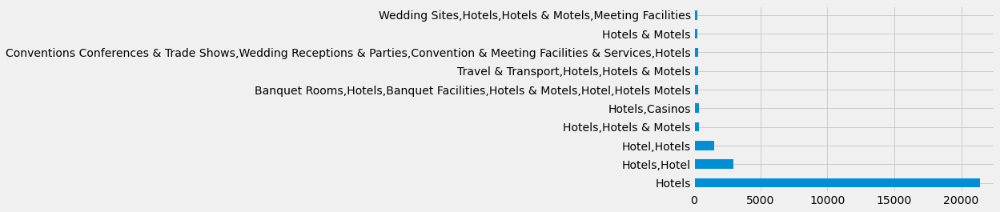

In [16]:
df.categories.value_counts()[:10].plot(kind = 'barh')

### Province with the most ratings counts

<AxesSubplot:>

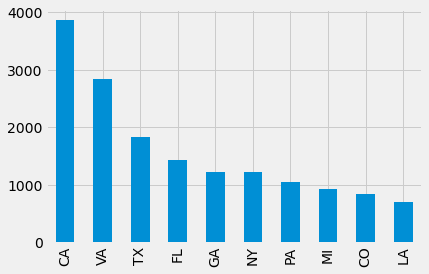

In [17]:
df.province.value_counts()[:10].plot(kind = 'bar')

### Histogram to check the spread of ratings

<AxesSubplot:ylabel='Frequency'>

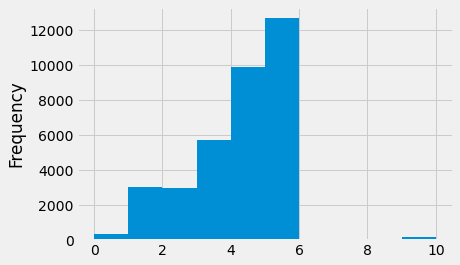

In [18]:
df.rating.plot(kind = 'hist')

<AxesSubplot:>

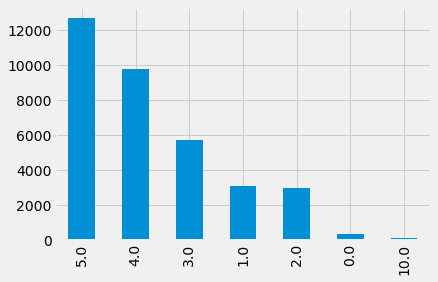

In [19]:
df.rating.value_counts()[:10].plot(kind = 'bar')

### Exploring ratings a bit more

<AxesSubplot:xlabel='rating'>

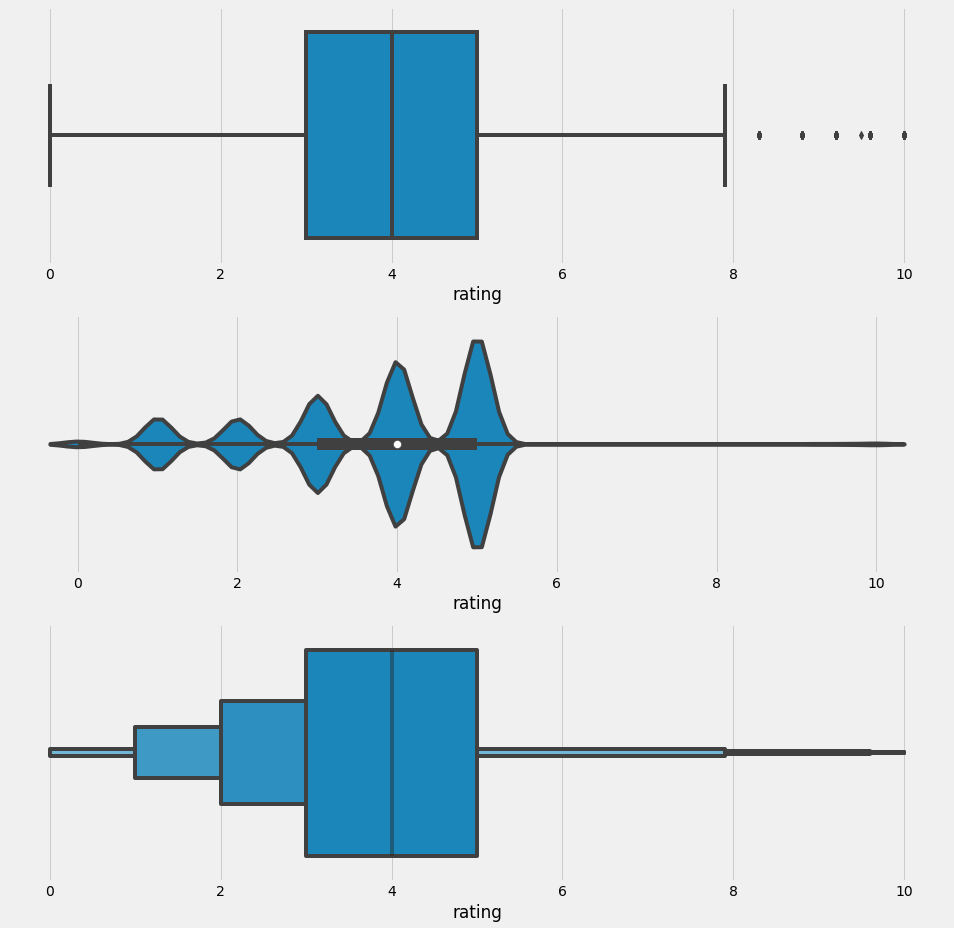

In [20]:
fix,axs = plt.subplots(nrows = 3,figsize = (15,15))
sns.boxplot(x = df.rating,ax = axs[0])
sns.violinplot(x = df.rating,ax = axs[1])
sns.boxenplot(x = df.rating,ax = axs[2])

### Plot for different hotels and their ratings

In [21]:
criteria = df['rating'] < 2.5
n_h_data = df.loc[criteria].dropna()


In [22]:
import folium
sf_map = folium.Map(location = [39.8283, -98.5795], zoom_start = 4)
incidents = folium.map.FeatureGroup()
for lat,lng in zip(n_h_data.latitude,n_h_data.longitude):
    incidents.add_child(folium.CircleMarker([lat,lng],
                                            radius=5,
                                            color = 'red',
                                            fill = True,
                                            fill_color= 'yellow',
                                           fill_opacity = 0.7)
                       )
# lats = list(dh_data.latitude)
# lngs = list(dh_data.longitude)
# label = list(dh_data.name)
# for lat,lng,label in zip(lats,lngs,labels):
#     folium.Marker([lat,lng],popup=label).add_to(sf_map)
sf_map.add_child(incidents)
sf_map

#The map indicates the pool of positive and negative rated hotels from the dataset

In [23]:
import plotly.graph_objects as go 
fig = go.Figure(data=go.Scattergeo( lon = df['longitude'], # column containing longitude information of the locations to plot 
                                   lat = df['latitude'], # column containing latitude information of the locations to plot 
                                   text = df['address'] + df.rating.astype(str), # column containing value to be displayed on hovering over the map 
                                   mode = 'markers', # a marker for each location 
                                   marker_color = df['rating'],
                                  ))
fig.update_layout( title = 'Hotels across United States', geo_scope='usa',legend=dict(yanchor="top",xanchor="left")) 
fig.show()



### Filtering ratings that have values greater than 3

In [24]:
good_hotels = df[df['rating'] > 3]
good_hotels.sample()

,name,address,city,postalcode,country,latitude,longitude,categories,province,date,dateadded,text,username,rating
2088,Doubletree By Hilton Hotel Bay City - Riverfront,1 Wenonah Park Pl,Bay City,48708,US,43.596927,-83.891054,"Conventions Conferences & Trade Shows,Wedding ...",MI,2015-10-30T00:00:00Z,2017-02-24T10:25:45Z,The bathrooms are immaculate which is really i...,Sandra P,4.0


### Plot for Very good hotels

In [25]:
import plotly.graph_objects as go 
fig = go.Figure(data=go.Scattergeo( lon = good_hotels['longitude'], # column containing longitude information of the locations to plot 
                                   lat = good_hotels['latitude'], # column containing latitude information of the locations to plot 
                                   text = good_hotels['name'], # column containing value to be displayed on hovering over the map 
                                   mode = 'markers', # a marker for each location 
                                   marker = {'color' : 'green'}
                                  )) 
fig.update_layout( title = 'Very good Hotels across United States', geo_scope='usa') 
fig.show()

In [26]:
avg_hotels = df[df['rating']<=3]
avg_hotels.sample()

,name,address,city,postalcode,country,latitude,longitude,categories,province,date,dateadded,text,username,rating
10667,Holiday Inn Express - Harrisburg East,4021 Union Deposit Rd,Harrisburg,17109,US,40.277723,-76.821103,Hotels,PA,2015-08-29T00:00:00Z,2016-10-28T18:29:02Z,We stayed two different nights and returned af...,Lucinda,3.0


In [27]:
import plotly.graph_objects as go 
fig = go.Figure(data=go.Scattergeo( lon = avg_hotels['longitude'], # column containing longitude information of the locations to plot 
                                   lat = avg_hotels['latitude'], # column containing latitude information of the locations to plot 
                                   text = avg_hotels['name'], # column containing value to be displayed on hovering over the map 
                                   mode = 'markers', # a marker for each location 
                                   marker = {'color' : 'red'}
                                  )) 
fig.update_layout( title = 'Average Hotels across United States', geo_scope='usa') 
fig.show()

In [28]:
hotels_by_state = df.groupby(['province'])['rating'].count().to_frame().reset_index().dropna()
hotels_by_state

,province,rating
0,AK,46
1,AL,367
2,AR,356
3,AZ,283
4,Andyville,36
...,...,...
282,Wmsbg,11
283,Woodbury,59
284,Yankee Hill,0
285,Yarmouth,332


In [29]:
fig = px.scatter_geo(hotels_by_state, locations="province", # name of column which contains state codes 
                     size="rating", # name of column which contains aggregate value to visualize 
                     locationmode = 'USA-states', 
                     hover_name='province', 
                     size_max=30) 
fig.update_layout(title_text = 'Hotels in the US by state',geo_scope='usa')



In [30]:
import plotly.express as px
import plotly
fig = px.treemap(df, path=[px.Constant("all"), 'province','city','name'], 
                 values='rating', color='province')
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()
plotly.offline.plot(fig, filename='PLOT.html')

'PLOT.html'

## __Data Preprocessing__

In [31]:
df_text = df[['rating','text']]
df_text.sample()

,rating,text
3626,1.0,"I was in a nonsmoking room, and the room itsel..."


### Function to clean the text column

In [32]:
def tweet_cleaner(text):
    from nltk.tokenize import WordPunctTokenizer
    tokenizer = WordPunctTokenizer()
    import re
    text=re.sub(r'@+','',text)
    text=re.sub('http?://[A-Za-z0-9./]+','',text)
    text=re.sub("[^a-zA-Z]", " ",text)
    lower_case = text.lower()
    words = tokenizer.tokenize(lower_case)
    return (" ".join(words)).strip()

### Applying the tweet_cleaner function to our text column

In [33]:
df_text['text_clean']=df_text['text'].astype(str).apply(tweet_cleaner)
df_text.sample()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,rating,text,text_clean
6079,4.0,Stay was fine once all the trouble with actual...,stay was fine once all the trouble with actual...


In [34]:
import nltk
from nltk.corpus import stopwords
from string import punctuation
from nltk.stem import wordnet
from nltk.stem import WordNetLemmatizer

In [35]:
# Tokenizing function

def tokenize(string):
    tokens = nltk.tokenize.word_tokenize(string)
    return " ".join(tokens)


#Removing stopwords from text

def removestopwords(string):
    #Removing punctuations
    for word in punctuation:
        string = string.replace(word,"")
        
    #Removing stopwords
    stopwords_remove = stopwords.words('english')
    stopwords_removed_tokens = []
    words = string.split(" ")
    
    for word in words:
        if word not in stopwords_remove:
            stopwords_removed_tokens.append(word)
    return " ".join(stopwords_removed_tokens)


# Lemmatizing function
def lemmatize(string):
    lem_words = WordNetLemmatizer()
    words = string.split()
    lemmatizeWords = []
    for word in words:
        lemmatizeWords.append(lem_words.lemmatize(word))
    return " ".join(lemmatizeWords)

def refine(string):
    return lemmatize(removestopwords(tokenize(string)))

In [36]:
df_text['refined_text'] = df_text['text_clean'].apply(refine)
df_text.sample()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,rating,text,text_clean,refined_text
3682,3.0,Stayed at this LaQuinta several times in the p...,stayed at this laquinta several times in the p...,stayed laquinta several time past great stayed...


In [37]:
from PIL import Image
import os
from os import path,getcwd
import numpy as np
import urllib
import matplotlib.pyplot as plt
from wordcloud import WordCloud,STOPWORDS

In [38]:
image_mask = np.array(Image.open('USA MAP BLACK.png'))

In [39]:
plt.style.use('ggplot')

In [40]:
text = df_text.refined_text.values

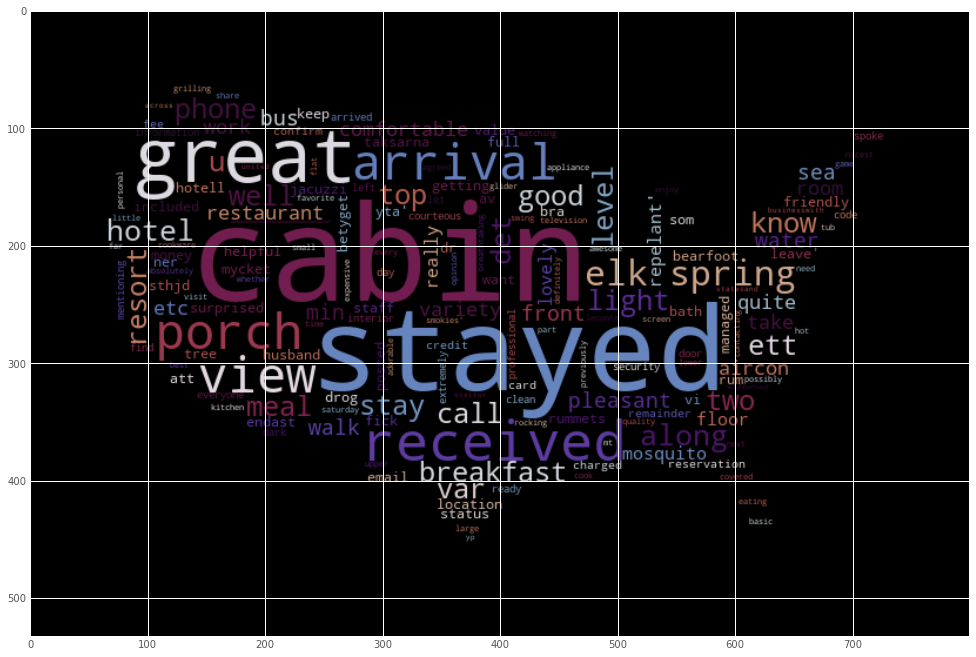

In [41]:
plt.figure(figsize=(15,15))
stopwords = set(STOPWORDS)
image_wc = WordCloud(background_color='black',max_words=2500,stopwords=stopwords,mask=image_mask,colormap='twilight_shifted')
image_wc.generate(str(text))
plt.imshow(image_wc,interpolation='bilinear')
plt.show()

## __Topic modeling__

### Using NMF

In [42]:
from sklearn.decomposition import NMF
t = 20
nmf = NMF(n_components = t,random_state = 42)

In [43]:
from sklearn.feature_extraction.text import CountVectorizer
count_vector = CountVectorizer(stop_words = 'english',max_features = None,max_df = 0.5,min_df = 2)

In [44]:
data = count_vector.fit_transform(df_text['refined_text'])

In [45]:
nmf.fit(data)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning:

The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).



NMF(n_components=20, random_state=42)

In [46]:
terms = count_vector.get_feature_names()
print("The different topics are: ")
for topic_idx,topic in enumerate(nmf.components_):
    print('Topic {}: '.format(topic_idx))
    print(" ".join([terms[i] for i in topic.argsort()[-10:]]))

The different topics are: 
Topic 0: 
got available large floor smell non small booked smoking room
Topic 1: 
price minute booked location town located old recommend com hotel
Topic 2: 
really close little overall value food restaurant price location good
Topic 3: 
perfect food beach experience price close view restaurant location great
Topic 4: 
overnight recommend wonderful family pleasant overall inn enjoyed definitely stay
Topic 5: 
pleasant extremely wonderful restaurant accommodating excellent location helpful friendly staff
Topic 6: 
big bit touch overall quiet close restaurant little really nice
Topic 7: 
spent trip parking second late morning noise sleep stayed night
Topic 8: 
easy spacious price close motel stayed friendly quiet comfortable clean
Topic 9: 
included waffle buffet egg hot morning continental coffee free breakfast
Topic 10: 
une il pa et el est en que le la
Topic 11: 
sleep double bathroom sheet size queen pillow king comfortable bed
Topic 12: 
resort family wate

### Using LDA

In [47]:
from sklearn.decomposition import LatentDirichletAllocation
t =20
lda = LatentDirichletAllocation(n_components = t,learning_method = 'batch',random_state = 42)

In [48]:
data_2 = count_vector.fit_transform(df_text['refined_text'])

In [49]:
lda.fit(data_2)

LatentDirichletAllocation(n_components=20, random_state=42)

In [50]:
terms = count_vector.get_feature_names()
print("The different topics are: ")
for topic_idx,topic in enumerate(lda.components_):
    print('Topic {}: '.format(topic_idx))
    print(" ".join([terms[i] for i in topic.argsort()[-10:]]))

The different topics are: 
Topic 0: 
fruit dog bed waffle good hotel egg coffee room breakfast
Topic 1: 
customer time beautiful experience amazing wonderful wedding hotel service staff
Topic 2: 
yp united room best visitor opinion share price neighborhood motel
Topic 3: 
desk got early arrived late booked hotel check night room
Topic 4: 
slow took got phone service minute problem desk check time
Topic 5: 
pillow noisy hear loud door noise sleep night room bed
Topic 6: 
breakfast comfortable bed stay staff hotel good clean nice room
Topic 7: 
personnel chambre une pour pa trs est la et le
Topic 8: 
work door water towel dirty bed floor bathroom shower room
Topic 9: 
bathroom small size large bed bedroom kitchen area suite room
Topic 10: 
view bar room hotel restaurant service beach staff food great
Topic 11: 
da los para del muy que en hotel el la
Topic 12: 
night service manager asked called said told desk hotel room
Topic 13: 
zimmer wir fr war der hotel sehr die da und
Topic 14: 
ni

In [51]:
import textblob
from textblob import TextBlob
def sentiments(x):
    return TextBlob(x).sentiment

In [52]:
df_text['sentiment_score'] = df_text['refined_text'].apply(sentiments)
df_text.sample()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,rating,text,text_clean,refined_text,sentiment_score
28624,5.0,Friendly staff. Easy to find and access from m...,friendly staff easy to find and access from ma...,friendly staff easy find access major highway ...,"(0.2902777777777778, 0.6111111111111112)"


# __Sentiment_Analysis__

## __Predicting Sentiments using Reviews__

### Using Naïve Bayes to predict Sentiments

In [54]:
import pandas as pd
from sklearn.model_selection import train_test_split
import joblib
from sklearn.feature_extraction.text import CountVectorizer
import seaborn as sns

In [55]:
df_text['reviews.polarity'] = [x[0] for x in df_text['sentiment_score']]
df_text.sample()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,rating,text,text_clean,refined_text,sentiment_score,reviews.polarity
15222,4.0,i stay at this hotel when I am on my business ...,i stay at this hotel when i am on my business ...,stay hotel business trip hotel clean comfortab...,"(0.3841269841269841, 0.5785714285714286)",0.384127


In [56]:
sent = df_text.filter(['refined_text','reviews.polarity'],axis=1)
sent.sample()

,refined_text,reviews.polarity
15631,stayed la quinta year concerned booking great ...,0.453333


In [57]:
for i in range(sent.shape[0]):
    if sent.iloc[i,1] > 0:
        sent.iloc[i,1] = 1
    if sent.iloc[i,1] < 0:
        sent.iloc[i,1] = -1

In [58]:
x = sent['refined_text']
y = sent['reviews.polarity']
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.25, random_state=33)

In [59]:
sent.head()

,refined_text,reviews.polarity
0,pleasant min walk along sea front water bus re...,1.0
1,really lovely hotel stayed top floor surprised...,1.0
2,ett mycket bra hotell det som drog ner betyget...,1.0
3,stayed four night october hotel staff welcomin...,1.0
4,stayed four night october hotel staff welcomin...,1.0


In [60]:
vec = CountVectorizer(stop_words='english')
x_train = vec.fit_transform(x_train).toarray()
x_test = vec.transform(x_test).toarray()

In [61]:
from sklearn.naive_bayes import MultinomialNB

model = MultinomialNB()
model.fit(x_train, y_train)

MultinomialNB()

In [62]:
model.score(x_test, y_test)

0.8572065047894855

In [63]:
y_predict = model.predict(x_test)

In [64]:
from sklearn.metrics import classification_report, confusion_matrix 
con_mat = confusion_matrix(y_predict, y_test)


<AxesSubplot:>

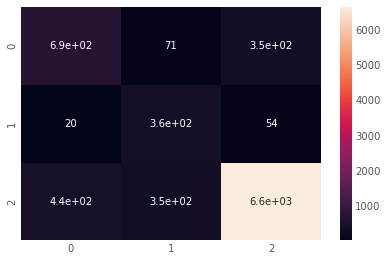

In [65]:
sns.heatmap(con_mat, annot=True)

### Decision Tree

In [66]:
from sklearn.tree import DecisionTreeClassifier
dct = DecisionTreeClassifier(criterion='entropy', random_state=1)

In [67]:
dct.fit(x_train, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=1)

In [68]:
y_pred = dct.predict(x_test)

In [71]:
from sklearn.metrics import accuracy_score
print("Accuracy: ",round(accuracy_score(y_test,y_pred),3))

Accuracy:  0.894


### Random Forest

In [73]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=200, random_state=0)

In [74]:
rf.fit(x_train, y_train)

RandomForestClassifier(n_estimators=200, random_state=0)

In [75]:
y_pred = rf.predict(x_test)

In [77]:
print("Accuracy: ",round(accuracy_score(y_test,y_pred),3))

Accuracy:  0.903


## __Predicting Sentiments using ratings__

In [78]:
df_text3 = df_text.loc[:,['rating','refined_text']]
df_text3.sample()

,rating,refined_text
26884,10.0,free wifi work well disappointing considering ...


In [79]:
# for ratings which originally are on the scale 1-10, here I identify these ratings and pick those which are not divisible by
# 0.5, not null, and which are <=5 ------> convert these on 1-5 scale
df_text3["ratings"] = df_text3["rating"].copy()
rowindex = df_text3["ratings"][(df_text3["ratings"]%0.5!=0) & (df_text3["ratings"].isna()==False) & (df_text3["ratings"]<=5)].index.to_list() 
df_text3.loc[rowindex,"ratings"]=df_text3.loc[rowindex,"ratings"]/2
df_text3.sample()

,rating,refined_text,ratings
4942,3.0,hotel convenient location stuff old town staff...,3.0


In [80]:
sentiment_rating = []
for i in df_text3["ratings"]:
        if i>=4.0 : sentiment_rating.append("positive")
        elif i>=3 : sentiment_rating.append("neutral")
            
        else:       sentiment_rating.append("negative")

In [81]:
df_text3['sentiment_rating'] = sentiment_rating
df_text3.sample()

,rating,refined_text,ratings,sentiment_rating
300,5.0,seeking accommodation complex family group age...,5.0,positive


In [82]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [83]:
df_text3['sentiment_label'] = le.fit_transform(df_text3['sentiment_rating'])
df_text3.sample()

,rating,refined_text,ratings,sentiment_rating,sentiment_label
25402,5.0,stayed hotel long career traveling state count...,5.0,positive,2


In [84]:
df_text3.dropna(subset=["ratings","rating"], inplace = True)
df_text3.isnull().sum()

rating              0
refined_text        0
ratings             0
sentiment_rating    0
sentiment_label     0
dtype: int64

In [85]:
df_text3.sentiment_label.value_counts()

2    22796
0     6546
1     5708
Name: sentiment_label, dtype: int64

### __Naïve Bayes__

#### Dividing the dataset into train and test

In [86]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
X = df_text3['refined_text']
Y = df_text3['sentiment_label']
# splitting the training and testing data set in 80,20 ratio

X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size=0.2, random_state=100)

In [87]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer()

#### Using CountVectorizer from sklearn

In [88]:
vectorizer.fit(X_train)
X_train = vectorizer.transform(X_train)
X_test = vectorizer.transform(X_test)

#### Fitting MultinomialNB

In [89]:
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
nb = MultinomialNB()
nb.fit(X_train,Y_train)

MultinomialNB()

#### Predicting the model

In [90]:
Y_test_pred=nb.predict(X_test)
Y_train_pred=nb.predict(X_train)

In [91]:
mnb_testing_data_accuracy = accuracy_score(Y_test, Y_test_pred)
print('Accuracy score of testing data : ', mnb_testing_data_accuracy)

Accuracy score of testing data :  0.7496433666191156


In [92]:
from sklearn import metrics
# Calculating precision, recall, f1score

print('Train Metrics : \n')
print(metrics.classification_report(Y_train, Y_train_pred, labels=[0, 1, 2]))

print('Test Metrics : \n')
print(metrics.classification_report(Y_test, Y_test_pred, labels=[0, 1, 2]))

Train Metrics : 

              precision    recall  f1-score   support

           0       0.69      0.77      0.73      5243
           1       0.60      0.36      0.45      4592
           2       0.85      0.91      0.88     18205

    accuracy                           0.79     28040
   macro avg       0.72      0.68      0.69     28040
weighted avg       0.78      0.79      0.78     28040

Test Metrics : 

              precision    recall  f1-score   support

           0       0.63      0.73      0.68      1303
           1       0.39      0.20      0.27      1116
           2       0.83      0.89      0.86      4591

    accuracy                           0.75      7010
   macro avg       0.62      0.61      0.60      7010
weighted avg       0.72      0.75      0.73      7010



In [93]:
def confusion_matrix(y,y_pred):
    TP = ((y+y_pred)== 2).sum()
    TN = ((y+y_pred)== 0).sum()
    FP = ((y-y_pred)== -1).sum()
    FN = ((y-y_pred)== 1).sum()
    return pd.DataFrame( [[TP, FP], [FN, TN]], index=[['Prediction', 'Prediction'],['Yes', 'No']], columns=[['Actual', 'Actual'],['Yes', 'No']])

In [100]:
from sklearn.metrics import confusion_matrix

In [106]:
mnb_cm = confusion_matrix(Y_test, Y_test_pred)
mnb_cm_df = pd.DataFrame(mnb_cm,index=['Negative','Neutral','Positive'], columns=['Negative','Neutral','Positive'])
mnb_cm_df

,Negative,Neutral,Positive
Negative,732,30,541
Neutral,157,85,874
Positive,97,78,4416


## __Fitting RandomForest__

In [95]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=200, random_state=0)

In [96]:
rf.fit(X_train, Y_train)

RandomForestClassifier(n_estimators=200, random_state=0)

In [97]:
Y_test_pred=rf.predict(X_test)
Y_train_pred=rf.predict(X_train)

In [98]:
rf_testing_data_accuracy = accuracy_score(Y_test, Y_test_pred)
print('Accuracy score of testing data : ', rf_testing_data_accuracy)

Accuracy score of testing data :  0.7465049928673324


In [99]:

from sklearn import metrics
# Calculating precision, recall, f1score

print('Train Metrics : \n')
print(metrics.classification_report(Y_train, Y_train_pred, labels=[0, 1, 2]))

print('Test Metrics : \n')
print(metrics.classification_report(Y_test, Y_test_pred, labels=[0, 1, 2]))

Train Metrics : 

              precision    recall  f1-score   support

           0       0.99      0.98      0.98      5243
           1       0.99      0.95      0.97      4592
           2       0.98      1.00      0.99     18205

    accuracy                           0.98     28040
   macro avg       0.99      0.97      0.98     28040
weighted avg       0.98      0.98      0.98     28040

Test Metrics : 

              precision    recall  f1-score   support

           0       0.74      0.56      0.64      1303
           1       0.44      0.08      0.13      1116
           2       0.76      0.96      0.85      4591

    accuracy                           0.75      7010
   macro avg       0.65      0.53      0.54      7010
weighted avg       0.70      0.75      0.69      7010

